In [1]:
# short script (unmaintained) to combining Stable Diffusion 2 text-conditioned inpainting with upscaler to create high resolution images

import PIL
from PIL import Image
import requests
from io import BytesIO
import numpy as np
import random

import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler, StableDiffusionUpscalePipeline

In [2]:
inpainting_repo_id = "/home/REPLACE_WITH_YOUR_PATH/stable-diffusion-2-inpainting"
upscaler_repo_id = "/home/REPLACE_WITH_YOUR_PATH/stable-diffusion-x4-upscaler"

In [3]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [4]:
init_image_full_size = Image.open("ginza_init.png") # .convert("RGB")
init_image = init_image_full_size.resize((512, 512))
mask_image = np.array(init_image)[:,:,3] # assume image has alpha mask (use .mode to check for "RGBA")
mask_image = Image.fromarray(255-mask_image).convert("RGB")
init_image = init_image.convert("RGB")

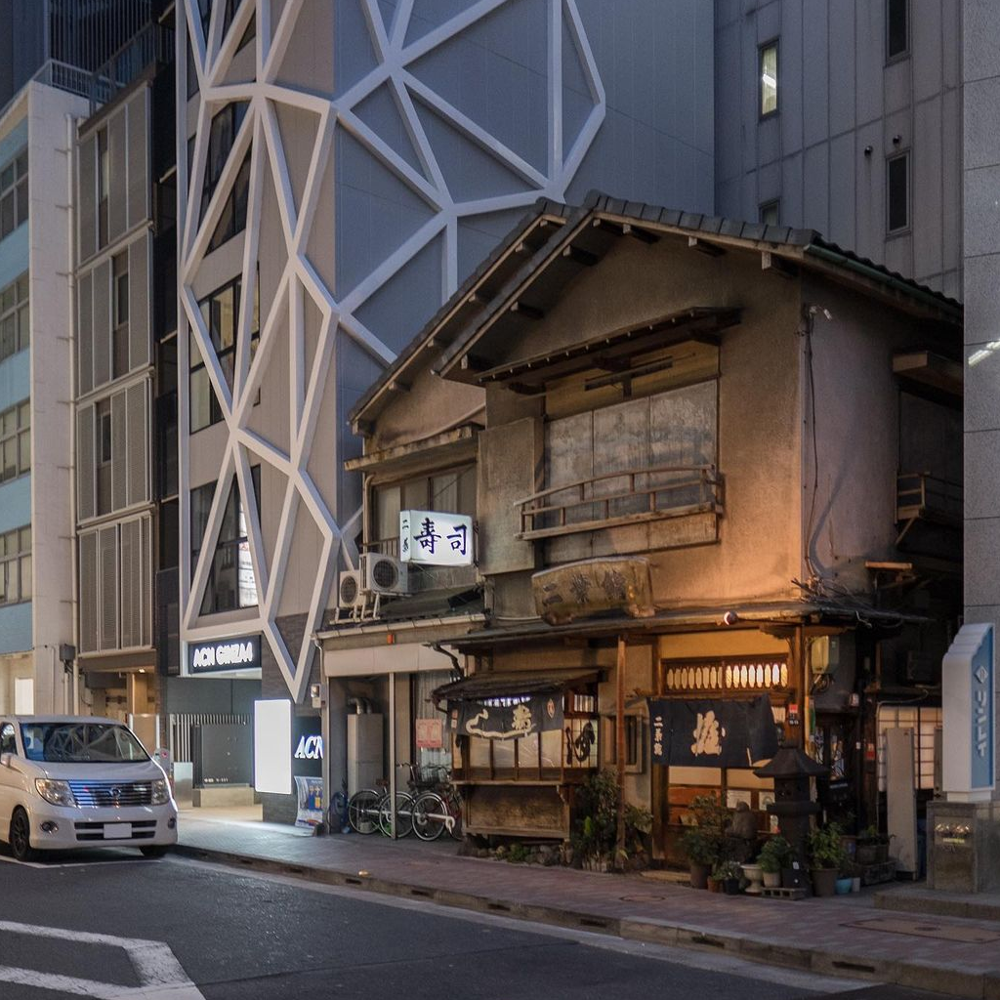

In [5]:
# Source: https://www.reddit.com/r/Tokyo/comments/pf5mo2/old_vs_new_futaba_sushi_restaurant_in_ginza_first/
Image.open("ginza_orig.png")

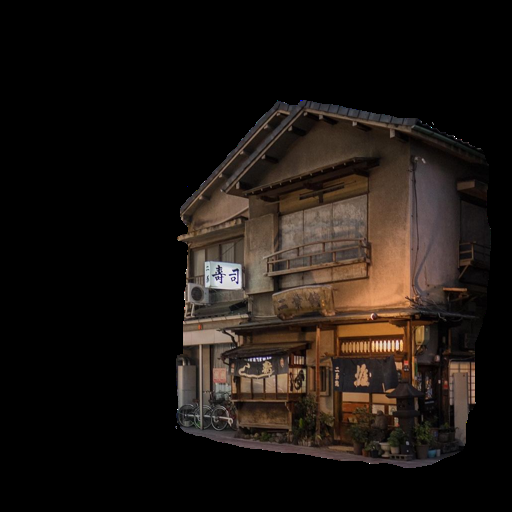

In [6]:
init_image

In [7]:
pipe = DiffusionPipeline.from_pretrained(inpainting_repo_id, torch_dtype=torch.float16, revision="fp16")
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")
def dummy(images, **kwargs):
    return images, False
pipe.safety_checker = dummy

uppipe = StableDiffusionUpscalePipeline.from_pretrained(upscaler_repo_id, torch_dtype=torch.float16)
uppipe = uppipe.to("cuda")
uppipe.safety_checker = dummy

professional photograph of Darth Vader's Death Star in Star Wars


  0%|          | 0/25 [00:00<?, ?it/s]

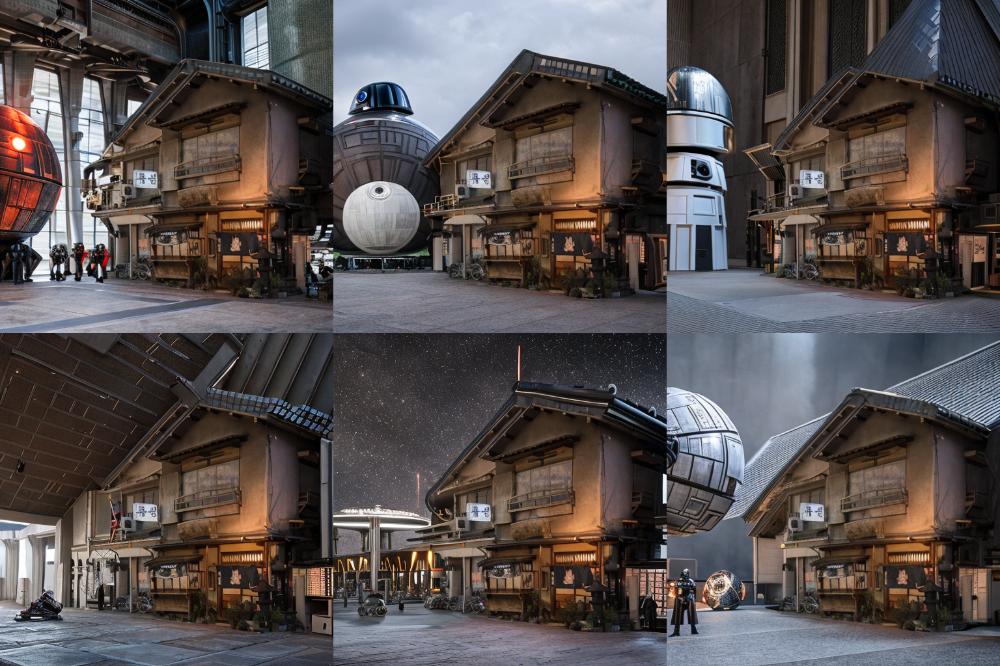

In [8]:
description = "professional photograph of Darth Vader's Death Star in Star Wars"
print(description)

orig_prompt = "A "+description+", epic, exciting, wow, cinematic, moody, exciting, stop motion, highly detailed, octane render, soft lighting, professional, 35mm, Zeiss, Hasselblad, Fujifilm, Arriflex, IMAX, 4k, 8k"
orig_negative_prompt = "bright, oversaturated, ugly, 3d, render, cartoon, grain, low-res, kitsch, blender, cropped, lowres, poorly drawn face, out of frame, poorly drawn hands, blurry, bad art, blurred, text, watermark, disfigured, deformed, mangled"

num_images = 6
prompt = [orig_prompt] * num_images
negative_prompt = [orig_negative_prompt] * num_images

images = pipe(prompt=prompt, negative_prompt=negative_prompt, image=init_image, mask_image=mask_image, num_inference_steps=25)[0]
image = image_grid(images, 2, 3)

image

In [9]:
hi_res_images = []
for i in range(num_images):
  low_res_image = images[i]
  prompt = [orig_prompt] * 1
  negative_prompt = [orig_negative_prompt] * 1
  hi_res_image = uppipe(prompt=prompt, negative_prompt=negative_prompt, image=low_res_image.resize((256, 256))).images[0]
  hi_res_image.paste(init_image_full_size, mask=init_image_full_size)
  hi_res_image = hi_res_image.convert("RGB")
  hi_res_images.append(hi_res_image)

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

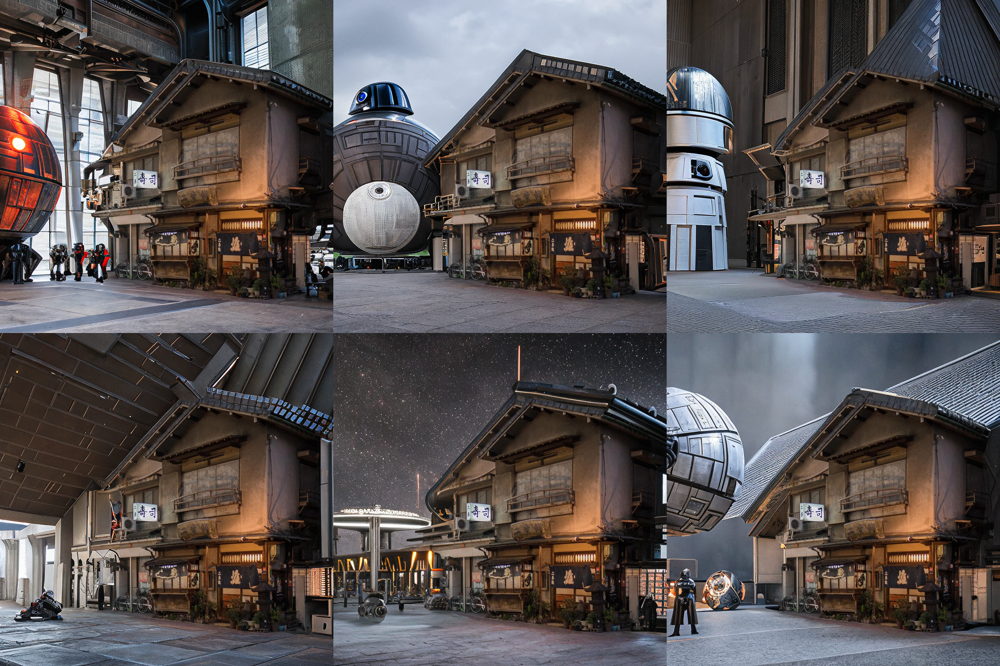

In [10]:
image = image_grid(hi_res_images, 2, 3)
image

In [13]:
start_counter = 1000
for i in range(num_images):
  hi_res_images[i].save("ginza."+str(start_counter+i)+".png")